# **Project Name**    -



##### **Project Type**    - EDA
##### **Contribution**    - Individual
##### **Name              -** K. Abhinay

# **Project Summary -**

In the streaming competition, services such as Amazon Prime Video are always adding more content. This project entails the examination of a dataset that includes all the shows present on Amazon Prime Video in the United States. The dataset provides data on more than 9,871 titles and 1,24,235 cast and crew entries, including :
* genre,
* production country,
* IMDb & TMDB ratings,
* Popularity and scores, 
* Imdb_id,
* id.\
Through data analysis, the project will be able to extract insightful information about content variety, regional distribution, Year wise trends, and audience interest.

# **GitHub Link -**

https://github.com/abhinay12890/Prime_EDA_Abhinay

# **Problem Statement**


The dataset provides an opportunity to explore and answer key business questions, such as:

**Content Diversity:** What genres and categories dominate Amazon Prime Video?\
**Regional Availability:** How does content distribution vary across different regions?\
**Trends Over Time:** How has Amazon Prime’s content library evolved?\
**IMDb Ratings & Popularity:** What are the highest-rated or most popular shows?

#### **Define Your Business Objective?**

The core objective of this project is to utilize data analytics to support Amazon Prime Video and other streaming services in making content decisions based on data. By determining trends in content performance, regional tastes, and audience interest, the learning will be utilized to maximize content acquisition, increase user satisfaction, and maximize overall subscription growth plans.

# **General Guidelines** : -  

1.   Well-structured, formatted, and commented code is required.
2.   Exception Handling, Production Grade Code & Deployment Ready Code will be a plus. Those students will be awarded some additional credits.
     
     The additional credits will have advantages over other students during Star Student selection.
       
             [ Note: - Deployment Ready Code is defined as, the whole .ipynb notebook should be executable in one go
                       without a single error logged. ]

3.   Each and every logic should have proper comments.
4. You may add as many number of charts you want. Make Sure for each and every chart the following format should be answered.
        

```
# Chart visualization code
```
            

*   Why did you pick the specific chart?
*   What is/are the insight(s) found from the chart?
* Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

5. You have to create at least 20 logical & meaningful charts having important insights.


[ Hints : - Do the Vizualization in  a structured way while following "UBM" Rule.

U - Univariate Analysis,

B - Bivariate Analysis (Numerical - Categorical, Numerical - Numerical, Categorical - Categorical)

M - Multivariate Analysis
 ]





# ***Let's Begin !***

## ***1. Know Your Data***

### Import Libraries

In [1]:
# Import Libraries
import numpy as np
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.figure_factory as ff
import plotly.express as px
from collections import Counter
from sklearn.preprocessing import MultiLabelBinarizer

### Dataset Loading

In [2]:
# Load Dataset
ti=pd.read_csv("titles.csv")
cr=pd.read_csv("credits.csv")

### Dataset First View

In [3]:
# Dataset First Look of both datasets
ti.head()

,id,title,type,description,release_year,age_certification,runtime,genres,production_countries,seasons,imdb_id,imdb_score,imdb_votes,tmdb_popularity,tmdb_score
0,ts20945,The Three Stooges,SHOW,The Three Stooges were an American vaudeville ...,1934,TV-PG,19,"['comedy', 'family', 'animation', 'action', 'f...",['US'],26.0,tt0850645,8.6,1092.0,15.424,7.6
1,tm19248,The General,MOVIE,"During America’s Civil War, Union spies steal ...",1926,NaN,78,"['action', 'drama', 'war', 'western', 'comedy'...",['US'],NaN,tt0017925,8.2,89766.0,8.647,8.0
2,tm82253,The Best Years of Our Lives,MOVIE,It's the hope that sustains the spirit of ever...,1946,NaN,171,"['romance', 'war', 'drama']",['US'],NaN,tt0036868,8.1,63026.0,8.435,7.8
3,tm83884,His Girl Friday,MOVIE,"Hildy, the journalist former wife of newspaper...",1940,NaN,92,"['comedy', 'drama', 'romance']",['US'],NaN,tt0032599,7.8,57835.0,11.270,7.4
4,tm56584,In a Lonely Place,MOVIE,An aspiring actress begins to suspect that her...,1950,NaN,94,"['thriller', 'drama', 'romance']",['US'],NaN,tt0042593,7.9,30924.0,8.273,7.6


In [4]:
cr.head()

,person_id,id,name,character,role
0,59401,ts20945,Joe Besser,Joe,ACTOR
1,31460,ts20945,Moe Howard,Moe,ACTOR
2,31461,ts20945,Larry Fine,Larry,ACTOR
3,21174,tm19248,Buster Keaton,Johnny Gray,ACTOR
4,28713,tm19248,Marion Mack,Annabelle Lee,ACTOR


### Dataset Rows & Columns count

In [5]:
# Dataset Rows & Columns count
print(f"title Dataset Rows: {ti.shape[0]} Columns: {ti.shape[1]}")
print(f"credits Dataset Rows: {cr.shape[0]} Columns: {cr.shape[1]}")

title Dataset Rows: 9871 Columns: 15
credits Dataset Rows: 124235 Columns: 5


### Dataset Information

In [6]:
# Dataset Info
ti.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9871 entries, 0 to 9870
Data columns (total 15 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   id                    9871 non-null   object 
 1   title                 9871 non-null   object 
 2   type                  9871 non-null   object 
 3   description           9752 non-null   object 
 4   release_year          9871 non-null   int64  
 5   age_certification     3384 non-null   object 
 6   runtime               9871 non-null   int64  
 7   genres                9871 non-null   object 
 8   production_countries  9871 non-null   object 
 9   seasons               1357 non-null   float64
 10  imdb_id               9204 non-null   object 
 11  imdb_score            8850 non-null   float64
 12  imdb_votes            8840 non-null   float64
 13  tmdb_popularity       9324 non-null   float64
 14  tmdb_score            7789 non-null   float64
dtypes: float64(5), int64(

In [7]:
cr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 124235 entries, 0 to 124234
Data columns (total 5 columns):
 #   Column     Non-Null Count   Dtype 
---  ------     --------------   ----- 
 0   person_id  124235 non-null  int64 
 1   id         124235 non-null  object
 2   name       124235 non-null  object
 3   character  107948 non-null  object
 4   role       124235 non-null  object
dtypes: int64(1), object(4)
memory usage: 4.7+ MB


In [8]:
ti['type']=ti['type'].astype("category")
ti['age_certification']=ti['age_certification'].astype('category')
cr['role']=cr['role'].astype('category')

In [9]:
ti.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9871 entries, 0 to 9870
Data columns (total 15 columns):
 #   Column                Non-Null Count  Dtype   
---  ------                --------------  -----   
 0   id                    9871 non-null   object  
 1   title                 9871 non-null   object  
 2   type                  9871 non-null   category
 3   description           9752 non-null   object  
 4   release_year          9871 non-null   int64   
 5   age_certification     3384 non-null   category
 6   runtime               9871 non-null   int64   
 7   genres                9871 non-null   object  
 8   production_countries  9871 non-null   object  
 9   seasons               1357 non-null   float64 
 10  imdb_id               9204 non-null   object  
 11  imdb_score            8850 non-null   float64 
 12  imdb_votes            8840 non-null   float64 
 13  tmdb_popularity       9324 non-null   float64 
 14  tmdb_score            7789 non-null   float64 
dtypes: c

In [10]:
cr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 124235 entries, 0 to 124234
Data columns (total 5 columns):
 #   Column     Non-Null Count   Dtype   
---  ------     --------------   -----   
 0   person_id  124235 non-null  int64   
 1   id         124235 non-null  object  
 2   name       124235 non-null  object  
 3   character  107948 non-null  object  
 4   role       124235 non-null  category
dtypes: category(1), int64(1), object(3)
memory usage: 3.9+ MB


#### Duplicate Values

In [11]:
# Dataset Duplicate Value Count
print("Dataset Duplicate Values")
print("title: ",ti.duplicated().sum())

print("credits: ",cr.duplicated().sum())

Dataset Duplicate Values
title:  3
credits:  56


In [12]:
ti.drop_duplicates(inplace=True)
cr.drop_duplicates(inplace=True)

#### Missing Values/Null Values

In [13]:
# Missing Values/Null Values Count
ti.isna().sum()

id                         0
title                      0
type                       0
description              119
release_year               0
age_certification       6484
runtime                    0
genres                     0
production_countries       0
seasons                 8511
imdb_id                  667
imdb_score              1021
imdb_votes              1031
tmdb_popularity          547
tmdb_score              2080
dtype: int64

In [14]:
cr.isna().sum()

person_id        0
id               0
name             0
character    16277
role             0
dtype: int64

In [15]:
def null_vis(df):   # function to represent null value count in columns of respective dataframe
    mi_ti_df=df.isna().sum().to_frame()
    mi_ti_df.reset_index(inplace=True)
    mi_ti_df.rename({'index':'col',0:"count"},axis='columns',inplace=True)
    mi_ti_df=mi_ti_df[mi_ti_df['count']!=0]
    mi_ti_df=mi_ti_df.sort_values("count")

    plt.figure(figsize=(10,5))
    sns.barplot(x=mi_ti_df['col'],y=mi_ti_df['count'],palette='husl',hue=mi_ti_df['col'])
    for i, value in enumerate(mi_ti_df["count"]):
        plt.annotate(str(value), xy=(i, value), ha='center', va='bottom')
    plt.title("No of Null Values")
    plt.xlabel('Columns')
    plt.ylabel("Count")
    plt.show()

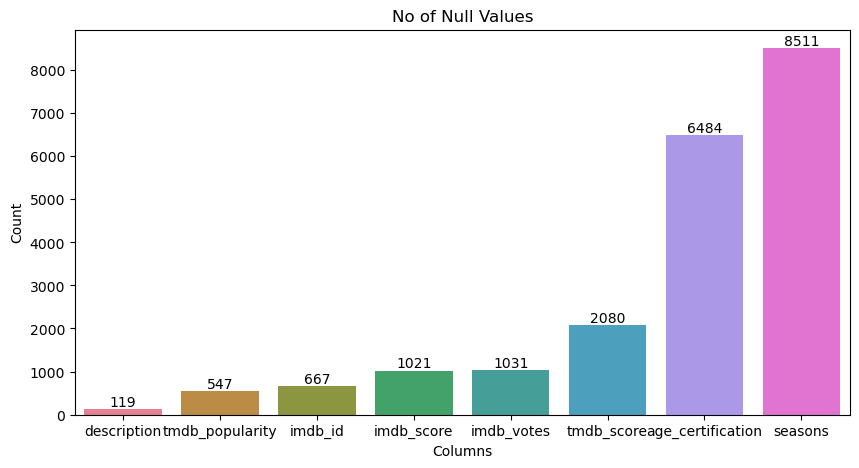

In [16]:
null_vis(ti)  # visualizing title.csv dataset

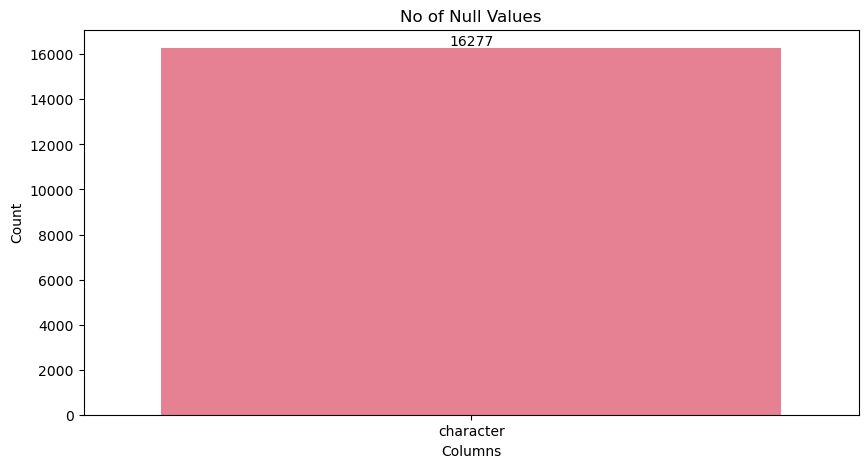

In [17]:
null_vis(cr) # visualizing credits.csv

### What did you know about your dataset?

There are duplicate values and null values in the dataset, which needs to be handled in order to make data-driven decisions.

## ***2. Understanding Your Variables***

In [18]:
# Dataset Columns
print(f"Title.csv columns: \n {list(ti.columns)}",end="\n")
print(f"credits.csv columns: \n {list(cr.columns)}")


Title.csv columns: 
 ['id', 'title', 'type', 'description', 'release_year', 'age_certification', 'runtime', 'genres', 'production_countries', 'seasons', 'imdb_id', 'imdb_score', 'imdb_votes', 'tmdb_popularity', 'tmdb_score']
credits.csv columns: 
 ['person_id', 'id', 'name', 'character', 'role']


In [19]:
# Dataset Describe
ti.describe()

,release_year,runtime,seasons,imdb_score,imdb_votes,tmdb_popularity,tmdb_score
count,9868.000000,9868.000000,1357.000000,8847.000000,8.837000e+03,9321.000000,7788.000000
mean,2001.345561,85.979124,2.791452,5.976534,8.536485e+03,6.912168,5.984117
std,25.792295,33.515714,4.148958,1.344028,4.592768e+04,30.008727,1.518040
min,1912.000000,1.000000,1.000000,1.100000,5.000000e+00,0.000011,0.800000
25%,1996.000000,65.000000,1.000000,5.100000,1.180000e+02,1.234000,5.100000
50%,2014.000000,89.000000,1.000000,6.100000,4.640000e+02,2.537000,6.000000
75%,2018.000000,102.000000,3.000000,6.900000,2.237000e+03,5.640000,6.900000
max,2022.000000,549.000000,51.000000,9.900000,1.133692e+06,1437.906000,10.000000


In [20]:
cr.describe()

,person_id
count,1.241790e+05
mean,4.065843e+05
std,5.617204e+05
min,1.000000e+00
25%,3.898850e+04
50%,1.339490e+05
75%,5.712810e+05
max,2.371153e+06


### Variables Description

there may be outliers in the title.csv file.

### Check Unique Values for each variable.

In [21]:
# Check Unique Values for each variable.
print("titles.csv unique values")
for x in ti.columns:
    print(x,ti[x].nunique())

print("---------------------------------------")
print("credit.csv unique values")
for x in cr.columns:
    print(x,cr[x].nunique())

titles.csv unique values
id 9868
title 9737
type 2
description 9734
release_year 110
age_certification 11
runtime 207
genres 2028
production_countries 497
seasons 32
imdb_id 9201
imdb_score 86
imdb_votes 3650
tmdb_popularity 5325
tmdb_score 89
---------------------------------------
credit.csv unique values
person_id 80508
id 8861
name 79758
character 71097
role 2


In [22]:
for x in ti.columns:
    print("titles.csv")
    print(x,ti[x].unique())

titles.csv
id ['ts20945' 'tm19248' 'tm82253' ... 'tm847725' 'tm1054116' 'ts275838']
titles.csv
title ['The Three Stooges' 'The General' 'The Best Years of Our Lives' ...
 'Chasing' 'Baikunth' 'Waking Up Eighty']
titles.csv
type ['SHOW', 'MOVIE']
Categories (2, object): ['MOVIE', 'SHOW']
titles.csv
description ["The Three Stooges were an American vaudeville and comedy team active from 1922 until 1970, best known for their 190 short subject films by Columbia Pictures that have been regularly airing on television since 1958. Their hallmark was physical farce and slapstick. In films, the stooges were commonly known by their actual first names. There were a total of six stooges over the act's run (with only three active at any given time), but Moe Howard and Larry Fine were the mainstays throughout the ensemble's nearly fifty-year run."
 "During America’s Civil War, Union spies steal engineer Johnnie Gray's beloved locomotive, 'The General'—with Johnnie's lady love aboard an attached boxcar

In [23]:
for x in cr.columns:
    print(x,cr[x].unique())

person_id [  59401   31460   31461 ... 1938565  728899 1938620]
id ['ts20945' 'tm19248' 'tm82253' ... 'tm1079144' 'tm847725' 'tm1054116']
name ['Joe Besser' 'Moe Howard' 'Larry Fine' ... 'Vijay Thakur' 'Vanya Wellens'
 'Vishwa Bhanu']
character ['Joe' 'Moe' 'Larry' ... 'Sanjay Thakur' 'Budhiya' 'Gissu']
role ['ACTOR', 'DIRECTOR']
Categories (2, object): ['ACTOR', 'DIRECTOR']


## 3. ***Data Wrangling***

### Data Wrangling Code

* Exploring title.csv

In [24]:
# Write your code to make your dataset analysis ready.
ti['production_countries']

0       ['US']
1       ['US']
2       ['US']
3       ['US']
4       ['US']
         ...  
9866    ['US']
9867    ['US']
9868    ['IN']
9869        []
9870        []
Name: production_countries, Length: 9868, dtype: object

In [25]:
ti[ti['production_countries']=="[]"] # filtering out inconsistent columns

,id,title,type,description,release_year,age_certification,runtime,genres,production_countries,seasons,imdb_id,imdb_score,imdb_votes,tmdb_popularity,tmdb_score
79,tm348419,Payoff in the Pacific,MOVIE,A documentary on .S. efforts against the Japan...,1945,NaN,56,[],[],NaN,NaN,NaN,NaN,0.600,NaN
379,tm18966,D-Day: The Normandy Invasion,MOVIE,Focusing on both the strategic overview of the...,1945,NaN,21,[],[],NaN,NaN,NaN,NaN,0.600,8.0
672,tm582037,Ye Shang Hai,MOVIE,NaN,1941,NaN,62,['drama'],[],NaN,tt3594666,NaN,NaN,NaN,NaN
731,tm686160,Peculiar Pets,MOVIE,"In this documentary, we meet the families whom...",1921,NaN,47,['documentation'],[],NaN,tt0981329,NaN,NaN,NaN,NaN
795,tm769632,Sri Valli,MOVIE,"Valli, a tribal girl falls in love with Muruga...",1945,NaN,114,['drama'],[],NaN,tt0240922,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9862,tm1049635,Devineni,MOVIE,The film explores the life story of the famous...,2021,NaN,122,['drama'],[],NaN,tt14039792,8.4,1188.0,0.945,NaN
9864,tm822572,Gun and a Hotel Bible,MOVIE,"Based on the original play, Gun and a Hotel Bi...",2021,NaN,58,['drama'],[],NaN,tt10661500,4.0,142.0,0.954,6.5
9865,ts295958,GameOn Titans,SHOW,Eight mobile gamers battle it out in a series ...,2021,NaN,17,[],[],1.0,tt14747014,NaN,NaN,NaN,NaN
9869,tm1054116,Baikunth,MOVIE,"This story is about prevalent caste problem, e...",2021,NaN,72,"['family', 'drama']",[],NaN,tt14331982,8.4,49.0,0.645,NaN


In [26]:
ti['production_countries']=np.where(ti['production_countries']=='[]',"['unknown']",ti['production_countries'])
ti['genres']=np.where(ti['genres']=="[]","['unknown']",ti['genres'])

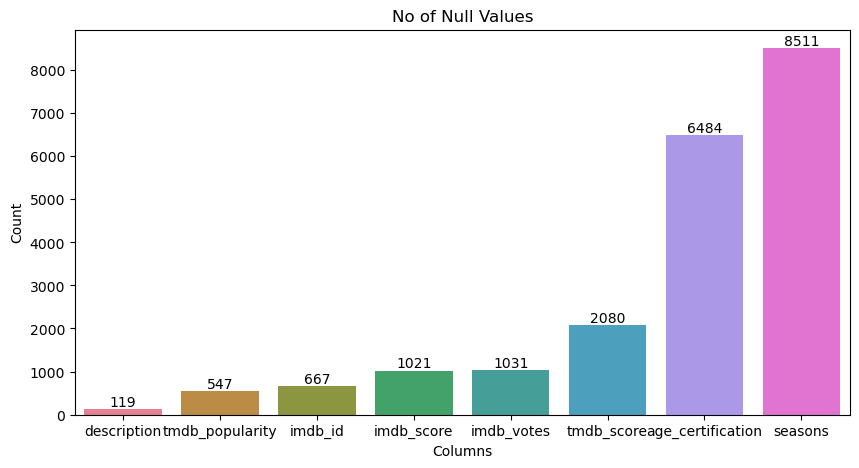

In [27]:
null_vis(ti)

In [28]:
ti['description']=ti['description'].fillna("Not Available")

In [29]:
ti[ti['seasons'].isna()]

,id,title,type,description,release_year,age_certification,runtime,genres,production_countries,seasons,imdb_id,imdb_score,imdb_votes,tmdb_popularity,tmdb_score
1,tm19248,The General,MOVIE,"During America’s Civil War, Union spies steal ...",1926,NaN,78,"['action', 'drama', 'war', 'western', 'comedy'...",['US'],NaN,tt0017925,8.2,89766.0,8.647,8.0
2,tm82253,The Best Years of Our Lives,MOVIE,It's the hope that sustains the spirit of ever...,1946,NaN,171,"['romance', 'war', 'drama']",['US'],NaN,tt0036868,8.1,63026.0,8.435,7.8
3,tm83884,His Girl Friday,MOVIE,"Hildy, the journalist former wife of newspaper...",1940,NaN,92,"['comedy', 'drama', 'romance']",['US'],NaN,tt0032599,7.8,57835.0,11.270,7.4
4,tm56584,In a Lonely Place,MOVIE,An aspiring actress begins to suspect that her...,1950,NaN,94,"['thriller', 'drama', 'romance']",['US'],NaN,tt0042593,7.9,30924.0,8.273,7.6
5,tm160494,Stagecoach,MOVIE,A group of people traveling on a stagecoach fi...,1939,NaN,96,"['western', 'drama']",['US'],NaN,tt0031971,7.8,48149.0,11.786,7.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9864,tm822572,Gun and a Hotel Bible,MOVIE,"Based on the original play, Gun and a Hotel Bi...",2021,NaN,58,['drama'],['unknown'],NaN,tt10661500,4.0,142.0,0.954,6.5
9866,tm510327,Lily Is Here,MOVIE,Dallas and heroin have one thing in common: Du...,2021,NaN,93,['drama'],['US'],NaN,tt7672388,5.3,20.0,1.406,NaN
9867,tm1079144,Jay Nog: Something from Nothing,MOVIE,Something From Nothing takes you on a stand-up...,2021,NaN,55,['comedy'],['US'],NaN,tt15041600,NaN,NaN,0.600,NaN
9868,tm847725,Chasing,MOVIE,A cop from Chennai sets out to nab a dreaded d...,2021,NaN,116,['crime'],['IN'],NaN,NaN,NaN,NaN,1.960,NaN


In [30]:
ti['seasons']=np.where(ti['type']=='MOVIE',0,ti['seasons']) # Since movies dont have seasons like tv shows

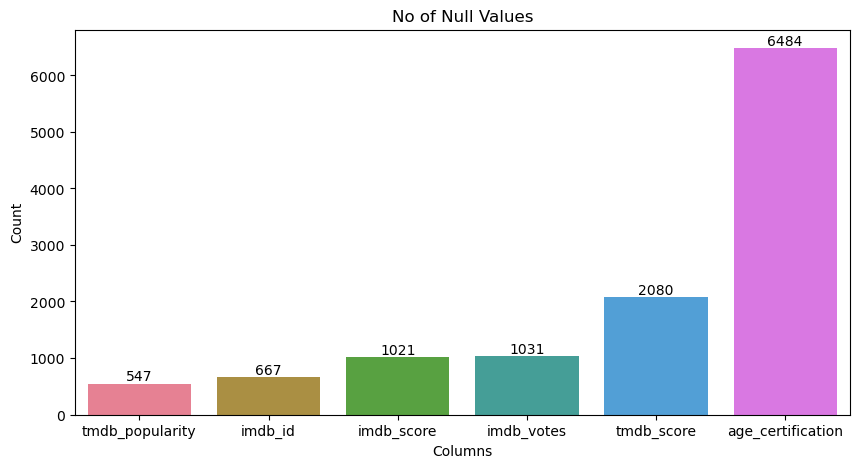

In [31]:
null_vis(ti)

In [32]:
(ti.isna().sum()/len(ti)*100).sort_values(ascending=False) # Finding out the percentage of null values

age_certification       65.707337
tmdb_score              21.078233
imdb_votes              10.447912
imdb_score              10.346575
imdb_id                  6.759222
tmdb_popularity          5.543170
id                       0.000000
title                    0.000000
type                     0.000000
description              0.000000
release_year             0.000000
runtime                  0.000000
genres                   0.000000
production_countries     0.000000
seasons                  0.000000
dtype: float64

In [33]:
ti.drop('age_certification',axis='columns',inplace=True) # Dropping Age_certification column because of huge NaN values and harder to fill the NaN values

In [34]:
ti.columns

Index(['id', 'title', 'type', 'description', 'release_year', 'runtime',
       'genres', 'production_countries', 'seasons', 'imdb_id', 'imdb_score',
       'imdb_votes', 'tmdb_popularity', 'tmdb_score'],
      dtype='object')

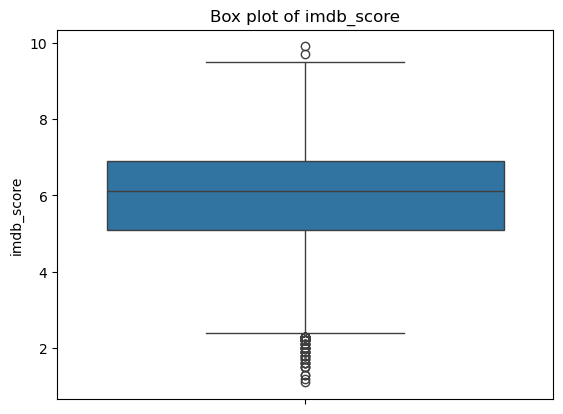

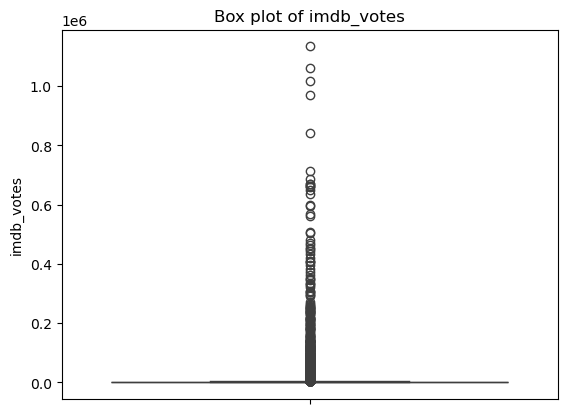

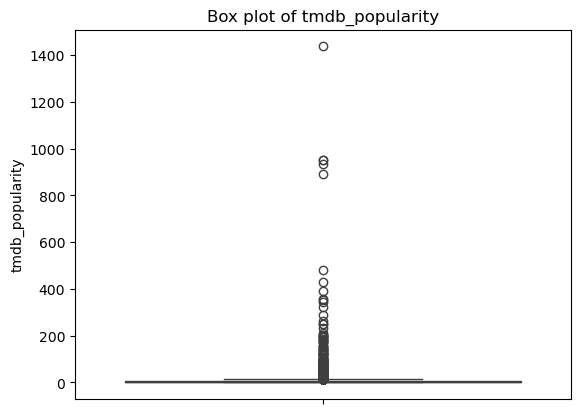

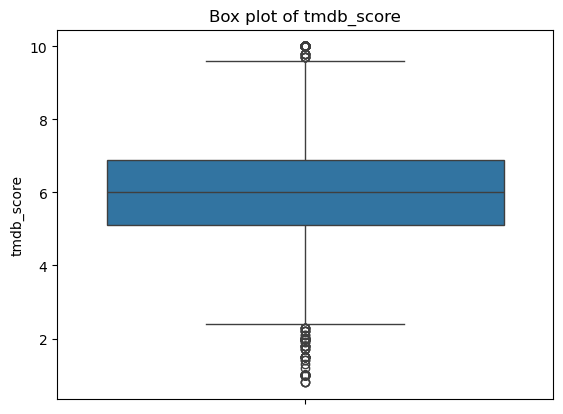

In [35]:
for x in ['imdb_score','imdb_votes','tmdb_popularity','tmdb_score']:
    sns.boxplot(ti[x],whis=1.5)
    plt.title(f'Box plot of {x}')
    plt.show()  # To visualize outliers in the columns

This confirms the presence of outliers on in the mentioned columns. So replacing the NaN values with Median is the safest approach.

In [36]:
for x in ['imdb_score','imdb_votes','tmdb_popularity','tmdb_score']:
    ti[x]=ti[x].fillna(ti[x].median())

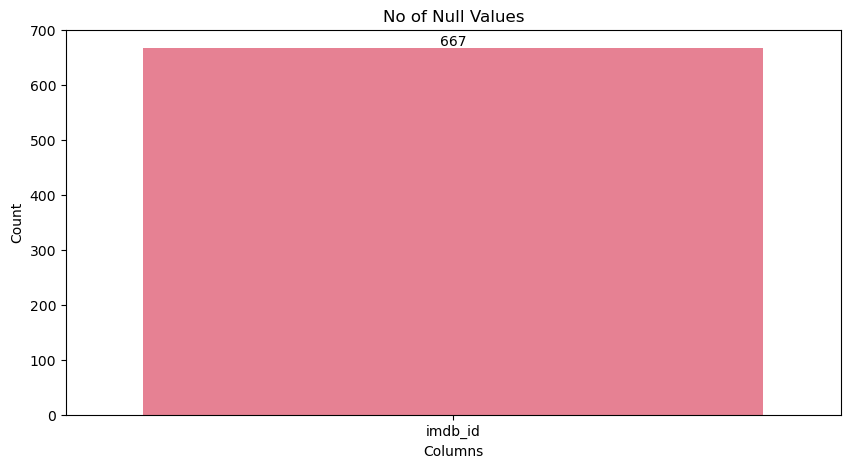

In [37]:
null_vis(ti)

In [38]:
ti['imdb_id']=ti['imdb_id'].fillna("Not Available")

In [39]:
ti.isna().sum()

id                      0
title                   0
type                    0
description             0
release_year            0
runtime                 0
genres                  0
production_countries    0
seasons                 0
imdb_id                 0
imdb_score              0
imdb_votes              0
tmdb_popularity         0
tmdb_score              0
dtype: int64

In [40]:
# using this function to count the number of occurances
def split_list(df,col):
    df[col] = df[col].apply(lambda x: eval(x) if isinstance(x, str) else x)

# Flatten the list of values into a single list
    combined = [value for sublist in df[col].dropna() for value in sublist]

# Count occurrences of each value
    combined_counts = Counter(combined)

# Convert to DataFrame for better visualization
    combined_df = pd.DataFrame(combined_counts.items(), columns=[col, 'Count'])

    return combined_df


In [41]:
ti.head()

,id,title,type,description,release_year,runtime,genres,production_countries,seasons,imdb_id,imdb_score,imdb_votes,tmdb_popularity,tmdb_score
0,ts20945,The Three Stooges,SHOW,The Three Stooges were an American vaudeville ...,1934,19,"['comedy', 'family', 'animation', 'action', 'f...",['US'],26.0,tt0850645,8.6,1092.0,15.424,7.6
1,tm19248,The General,MOVIE,"During America’s Civil War, Union spies steal ...",1926,78,"['action', 'drama', 'war', 'western', 'comedy'...",['US'],0.0,tt0017925,8.2,89766.0,8.647,8.0
2,tm82253,The Best Years of Our Lives,MOVIE,It's the hope that sustains the spirit of ever...,1946,171,"['romance', 'war', 'drama']",['US'],0.0,tt0036868,8.1,63026.0,8.435,7.8
3,tm83884,His Girl Friday,MOVIE,"Hildy, the journalist former wife of newspaper...",1940,92,"['comedy', 'drama', 'romance']",['US'],0.0,tt0032599,7.8,57835.0,11.270,7.4
4,tm56584,In a Lonely Place,MOVIE,An aspiring actress begins to suspect that her...,1950,94,"['thriller', 'drama', 'romance']",['US'],0.0,tt0042593,7.9,30924.0,8.273,7.6


In [42]:
ti_tv=ti[ti["type"]=='SHOW']
ti_mv=ti[ti['type']=='MOVIE']

In [43]:
ti_tv

,id,title,type,description,release_year,runtime,genres,production_countries,seasons,imdb_id,imdb_score,imdb_votes,tmdb_popularity,tmdb_score
0,ts20945,The Three Stooges,SHOW,The Three Stooges were an American vaudeville ...,1934,19,"['comedy', 'family', 'animation', 'action', 'f...",['US'],26.0,tt0850645,8.6,1092.0,15.424,7.6
91,ts55748,What's My Line?,SHOW,Four panelists must determine guests' occupati...,1950,30,"['reality', 'family']",['US'],18.0,tt1036980,8.6,1563.0,87.392,6.9
956,ts20005,I Love Lucy,SHOW,Cuban Bandleader Ricky Ricardo would be happy ...,1951,30,"['comedy', 'family']",['US'],9.0,tt0043208,8.5,25944.0,17.088,8.1
969,ts42867,Mister Rogers' Neighborhood,SHOW,Mister Rogers' Neighborhood is an American chi...,1968,29,"['fantasy', 'music', 'family']",['US'],31.0,tt0062588,8.7,8675.0,8.747,4.7
980,ts21930,Lupin the Third,SHOW,Arsene Lupin III is the grandson of the master...,1971,23,"['scifi', 'animation', 'action', 'comedy', 'cr...",['JP'],6.0,tt0159175,7.9,2116.0,45.829,8.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9833,ts302433,Aham Bhramhasmi,SHOW,Good news? A new online game that deposits hug...,2021,25,['unknown'],['unknown'],1.0,Not Available,6.1,464.0,1.816,6.0
9858,ts320425,Funny Little Stories,SHOW,Not Available,2021,28,['comedy'],['PT'],1.0,Not Available,6.1,464.0,0.600,6.0
9859,ts273173,Exquisite Wolf Heart,SHOW,A friendship born out of conflict marks the st...,2021,46,['drama'],['CN'],1.0,Not Available,6.1,464.0,12.879,6.0
9865,ts295958,GameOn Titans,SHOW,Eight mobile gamers battle it out in a series ...,2021,17,['unknown'],['unknown'],1.0,tt14747014,6.1,464.0,2.537,6.0


In [44]:
tv_genres=split_list(ti_tv,'genres')
tv_genres

,genres,Count
0,comedy,431
1,family,222
2,animation,289
3,action,189
4,fantasy,131
5,horror,50
6,reality,136
7,music,31
8,scifi,176
9,crime,155


In [45]:
tv_production=split_list(ti_tv,'production_countries')
tv_production

,production_countries,Count
0,US,472
1,JP,109
2,GB,263
3,unknown,154
4,CA,82
5,AU,62
6,CH,1
7,FR,25
8,MX,13
9,BE,1


In [46]:
mv_genres=split_list(ti_mv,'genres')
mv_genres

,genres,Count
0,action,1631
1,drama,4224
2,war,284
3,western,473
4,comedy,2556
5,european,596
6,romance,1620
7,thriller,1985
8,family,529
9,fantasy,423


In [47]:
mv_production=split_list(ti_mv,'production_countries')
mv_production

,production_countries,Count
0,US,4859
1,GB,665
2,MX,51
3,CA,448
4,DE,154
...,...,...
112,EC,1
113,AM,1
114,SY,1
115,CM,1


In [48]:
ti_tv.head()

,id,title,type,description,release_year,runtime,genres,production_countries,seasons,imdb_id,imdb_score,imdb_votes,tmdb_popularity,tmdb_score
0,ts20945,The Three Stooges,SHOW,The Three Stooges were an American vaudeville ...,1934,19,"[comedy, family, animation, action, fantasy, h...",[US],26.0,tt0850645,8.6,1092.0,15.424,7.6
91,ts55748,What's My Line?,SHOW,Four panelists must determine guests' occupati...,1950,30,"[reality, family]",[US],18.0,tt1036980,8.6,1563.0,87.392,6.9
956,ts20005,I Love Lucy,SHOW,Cuban Bandleader Ricky Ricardo would be happy ...,1951,30,"[comedy, family]",[US],9.0,tt0043208,8.5,25944.0,17.088,8.1
969,ts42867,Mister Rogers' Neighborhood,SHOW,Mister Rogers' Neighborhood is an American chi...,1968,29,"[fantasy, music, family]",[US],31.0,tt0062588,8.7,8675.0,8.747,4.7
980,ts21930,Lupin the Third,SHOW,Arsene Lupin III is the grandson of the master...,1971,23,"[scifi, animation, action, comedy, crime]",[JP],6.0,tt0159175,7.9,2116.0,45.829,8.0


In [49]:
tv_g_exploded=ti_tv.explode('genres') # it unpacks the lists in columns

avg_runtime_tv=tv_g_exploded.groupby('genres')['runtime'].mean() # groups by a particular values

avg_runtime_tv


genres
action           33.804233
animation        19.200692
comedy           29.116009
crime            47.445161
documentation    43.325000
drama            42.726766
european         40.948276
family           21.301802
fantasy          28.656489
history          49.113924
horror           35.980000
music            25.032258
reality          38.514706
romance          39.145038
scifi            31.568182
sport            39.577778
thriller         43.507463
unknown          31.092593
war              51.450000
western          42.312500
Name: runtime, dtype: float64

In [50]:
avg_runtime_tv.index

Index(['action', 'animation', 'comedy', 'crime', 'documentation', 'drama',
       'european', 'family', 'fantasy', 'history', 'horror', 'music',
       'reality', 'romance', 'scifi', 'sport', 'thriller', 'unknown', 'war',
       'western'],
      dtype='object', name='genres')

In [51]:
mv_g_exploded=ti_mv.explode('genres')

avg_runtime_mv=mv_g_exploded.groupby('genres')
avg_runtime_mv=avg_runtime_mv['runtime'].mean()

avg_runtime_mv

genres
action            99.237891
animation         74.704301
comedy            92.348200
crime             97.883105
documentation     80.094626
drama            101.437500
european         100.214765
family            94.453686
fantasy           94.822695
history          105.968454
horror            89.338916
music             84.083538
reality          134.000000
romance          100.891975
scifi             91.778828
sport             98.081967
thriller          99.424685
unknown           81.309677
war              101.151408
western           73.541226
Name: runtime, dtype: float64

In [52]:
tmdb_pop_tv=ti_tv[['title','tmdb_popularity']].sort_values(by='tmdb_popularity',ascending=True)
tmdb_pop_tv

,title,tmdb_popularity
2498,Jim Henson's The Storyteller: Greek Myths,0.000164
8264,I Fell In Love With A Sanki,0.600000
8719,Monty & Co.,0.600000
8712,Becharey,0.600000
4436,Wars Against Saddam,0.600000
...,...,...
8939,Reacher,323.037000
4573,Vikings,344.245000
5287,Better Call Saul,352.657000
4099,Suits,356.533000


In [53]:
tmdb_pop_mv=ti_mv[['title','tmdb_popularity']].sort_values(by='tmdb_popularity',ascending=True)
tmdb_pop_mv

,title,tmdb_popularity
1995,The Murder of Mary Phagan,0.000011
2603,Daar,0.000153
3137,Millennium,0.001609
4440,Alcatraz Prison Escape: Deathbed Confession,0.002363
5077,Amazon Jack,0.002688
...,...,...
8948,Clifford the Big Red Dog,482.744000
7421,Sonic the Hedgehog,893.650000
8964,Hotel Transylvania: Transformania,934.545000
9039,The eighth clause,950.986000


In [54]:
ti_mv_gr=ti_mv.explode("genres")

ti_mv_gr=ti_mv_gr.groupby('genres')

ti_mv_gr_p=ti_mv_gr['tmdb_popularity'].mean().sort_values(ascending=True).reset_index()

ti_mv_gr_p=ti_mv_gr_p[ti_mv_gr_p['genres']!='unknown']

ti_mv_gr_p

,genres,tmdb_popularity
1,reality,2.440000
2,western,2.742008
3,documentation,3.049597
4,music,3.342752
5,sport,4.993754
6,drama,5.396865
7,comedy,5.925862
8,romance,6.132912
9,history,6.520521
10,crime,7.023923


In [55]:
ti_tv_gr=ti_tv.explode('genres').groupby('genres')
ti_tv_gr_p=ti_tv_gr['tmdb_popularity'].mean().sort_values(ascending=True).reset_index()

ti_tv_gr_p=ti_tv_gr_p[ti_tv_gr_p['genres']!='unknown']

ti_tv_gr_p

,genres,tmdb_popularity
1,documentation,4.478008
2,reality,7.371294
3,music,9.850613
4,family,10.828149
5,animation,11.607909
6,sport,12.086422
7,western,13.450938
8,history,15.078658
9,european,17.154940
10,comedy,17.672043


In [56]:
ti_tv.head()

,id,title,type,description,release_year,runtime,genres,production_countries,seasons,imdb_id,imdb_score,imdb_votes,tmdb_popularity,tmdb_score
0,ts20945,The Three Stooges,SHOW,The Three Stooges were an American vaudeville ...,1934,19,"[comedy, family, animation, action, fantasy, h...",[US],26.0,tt0850645,8.6,1092.0,15.424,7.6
91,ts55748,What's My Line?,SHOW,Four panelists must determine guests' occupati...,1950,30,"[reality, family]",[US],18.0,tt1036980,8.6,1563.0,87.392,6.9
956,ts20005,I Love Lucy,SHOW,Cuban Bandleader Ricky Ricardo would be happy ...,1951,30,"[comedy, family]",[US],9.0,tt0043208,8.5,25944.0,17.088,8.1
969,ts42867,Mister Rogers' Neighborhood,SHOW,Mister Rogers' Neighborhood is an American chi...,1968,29,"[fantasy, music, family]",[US],31.0,tt0062588,8.7,8675.0,8.747,4.7
980,ts21930,Lupin the Third,SHOW,Arsene Lupin III is the grandson of the master...,1971,23,"[scifi, animation, action, comedy, crime]",[JP],6.0,tt0159175,7.9,2116.0,45.829,8.0


In [57]:
tv_year=ti_tv.groupby('release_year') 
tv_year_count=tv_year['type'].value_counts().to_frame(name='count').reset_index()

tv_year_count=tv_year_count[tv_year_count['type']!="MOVIE"]

tv_year_count    # give numbers of releases in a year

,release_year,type,count
0,1934,SHOW,1
2,1950,SHOW,1
4,1951,SHOW,1
6,1952,SHOW,1
8,1953,SHOW,2
...,...,...,...
118,2018,SHOW,117
120,2019,SHOW,104
122,2020,SHOW,124
124,2021,SHOW,141


In [58]:
mv_year=ti_mv.groupby('release_year')
mv_year_count=mv_year['type'].value_counts().to_frame(name='count').reset_index()

mv_year_count=mv_year_count[mv_year_count['type']!='SHOW']
mv_year_count

,release_year,type,count
0,1912,MOVIE,1
2,1914,MOVIE,2
4,1915,MOVIE,5
6,1916,MOVIE,2
8,1917,MOVIE,1
...,...,...,...
210,2018,MOVIE,568
212,2019,MOVIE,703
214,2020,MOVIE,574
216,2021,MOVIE,715


In [59]:
tv_iscore= ti_tv[["title",'imdb_score','imdb_votes']].sort_values(by=["imdb_votes"],ascending=False).drop("imdb_votes",axis='columns') 
tv_iscore #Considering votes because it defines how good by taking majority of people 

,title,imdb_score
2810,Dexter,8.7
2807,How I Met Your Mother,8.3
4573,Vikings,8.5
2808,House,8.7
5287,Better Call Saul,8.8
...,...,...
6976,Visions of Greatness,7.0
4056,Bogyó és Babóca,9.0
1936,Babar,6.6
6931,Imada x Higashino no Carigyura,6.2


In [60]:
mv_iscore= ti_mv[["title",'imdb_score','imdb_votes']].sort_values(by=["imdb_votes","imdb_score"],ascending=False).drop('imdb_votes',axis='columns')
mv_iscore

,title,imdb_score
2220,Titanic,7.9
2230,The Usual Suspects,8.5
2237,Braveheart,8.4
2229,The Sixth Sense,8.2
1814,The Terminator,8.1
...,...,...
5249,8 Hours,6.2
9805,I Write My Life,5.6
1229,Doc,4.4
8278,Blackwater,4.4


In [61]:
ti_mv.head()

,id,title,type,description,release_year,runtime,genres,production_countries,seasons,imdb_id,imdb_score,imdb_votes,tmdb_popularity,tmdb_score
1,tm19248,The General,MOVIE,"During America’s Civil War, Union spies steal ...",1926,78,"[action, drama, war, western, comedy, european]",[US],0.0,tt0017925,8.2,89766.0,8.647,8.0
2,tm82253,The Best Years of Our Lives,MOVIE,It's the hope that sustains the spirit of ever...,1946,171,"[romance, war, drama]",[US],0.0,tt0036868,8.1,63026.0,8.435,7.8
3,tm83884,His Girl Friday,MOVIE,"Hildy, the journalist former wife of newspaper...",1940,92,"[comedy, drama, romance]",[US],0.0,tt0032599,7.8,57835.0,11.270,7.4
4,tm56584,In a Lonely Place,MOVIE,An aspiring actress begins to suspect that her...,1950,94,"[thriller, drama, romance]",[US],0.0,tt0042593,7.9,30924.0,8.273,7.6
5,tm160494,Stagecoach,MOVIE,A group of people traveling on a stagecoach fi...,1939,96,"[western, drama]",[US],0.0,tt0031971,7.8,48149.0,11.786,7.7


In [62]:
countrywise_genres_mv = ti_mv.explode("production_countries").explode("genres")
countrywise_genres_mv = countrywise_genres_mv.groupby(['production_countries', 'genres']).size().reset_index(name='count')
countrywise_genres_mv=countrywise_genres_mv.reset_index().drop('index',axis='columns')

countrywise_genres_mv    # country wise genre counts  for movies

,production_countries,genres,count
0,AE,action,2
1,AE,comedy,2
2,AE,crime,1
3,AE,drama,5
4,AE,european,2
...,...,...,...
1013,unknown,sport,5
1014,unknown,thriller,98
1015,unknown,unknown,86
1016,unknown,war,4


In [63]:
countrywise_genres_tv = ti_tv.explode("production_countries").explode("genres")
countrywise_genres_tv = countrywise_genres_tv.groupby(['production_countries', 'genres']).size().reset_index(name='count')
countrywise_genres_tv=countrywise_genres_tv.reset_index().drop('index',axis='columns')

countrywise_genres_tv    # country wise genre counts  for shows

,production_countries,genres,count
0,AR,action,1
1,AR,comedy,2
2,AR,crime,1
3,AR,documentation,1
4,AR,drama,3
...,...,...,...
339,unknown,sport,6
340,unknown,thriller,6
341,unknown,unknown,24
342,unknown,war,1


In [64]:
ti_tv.head()

,id,title,type,description,release_year,runtime,genres,production_countries,seasons,imdb_id,imdb_score,imdb_votes,tmdb_popularity,tmdb_score
0,ts20945,The Three Stooges,SHOW,The Three Stooges were an American vaudeville ...,1934,19,"[comedy, family, animation, action, fantasy, h...",[US],26.0,tt0850645,8.6,1092.0,15.424,7.6
91,ts55748,What's My Line?,SHOW,Four panelists must determine guests' occupati...,1950,30,"[reality, family]",[US],18.0,tt1036980,8.6,1563.0,87.392,6.9
956,ts20005,I Love Lucy,SHOW,Cuban Bandleader Ricky Ricardo would be happy ...,1951,30,"[comedy, family]",[US],9.0,tt0043208,8.5,25944.0,17.088,8.1
969,ts42867,Mister Rogers' Neighborhood,SHOW,Mister Rogers' Neighborhood is an American chi...,1968,29,"[fantasy, music, family]",[US],31.0,tt0062588,8.7,8675.0,8.747,4.7
980,ts21930,Lupin the Third,SHOW,Arsene Lupin III is the grandson of the master...,1971,23,"[scifi, animation, action, comedy, crime]",[JP],6.0,tt0159175,7.9,2116.0,45.829,8.0


In [65]:
ti_tv.drop(['id','title','description','imdb_id'],axis='columns',inplace=True) # unnecessary for finding the correlation

In [66]:
ti_tv.head()

,type,release_year,runtime,genres,production_countries,seasons,imdb_score,imdb_votes,tmdb_popularity,tmdb_score
0,SHOW,1934,19,"[comedy, family, animation, action, fantasy, h...",[US],26.0,8.6,1092.0,15.424,7.6
91,SHOW,1950,30,"[reality, family]",[US],18.0,8.6,1563.0,87.392,6.9
956,SHOW,1951,30,"[comedy, family]",[US],9.0,8.5,25944.0,17.088,8.1
969,SHOW,1968,29,"[fantasy, music, family]",[US],31.0,8.7,8675.0,8.747,4.7
980,SHOW,1971,23,"[scifi, animation, action, comedy, crime]",[JP],6.0,7.9,2116.0,45.829,8.0


In [67]:
ti_tv.columns

Index(['type', 'release_year', 'runtime', 'genres', 'production_countries',
       'seasons', 'imdb_score', 'imdb_votes', 'tmdb_popularity', 'tmdb_score'],
      dtype='object')

In [68]:
tv_genres_ratings=ti_tv[["genres",'imdb_score','imdb_votes', 'tmdb_popularity', 'tmdb_score']]

In [69]:
tv_genres_ratings

,genres,imdb_score,imdb_votes,tmdb_popularity,tmdb_score
0,"[comedy, family, animation, action, fantasy, h...",8.6,1092.0,15.424,7.6
91,"[reality, family]",8.6,1563.0,87.392,6.9
956,"[comedy, family]",8.5,25944.0,17.088,8.1
969,"[fantasy, music, family]",8.7,8675.0,8.747,4.7
980,"[scifi, animation, action, comedy, crime]",7.9,2116.0,45.829,8.0
...,...,...,...,...,...
9833,[unknown],6.1,464.0,1.816,6.0
9858,[comedy],6.1,464.0,0.600,6.0
9859,[drama],6.1,464.0,12.879,6.0
9865,[unknown],6.1,464.0,2.537,6.0


In [70]:
mlb_genres = MultiLabelBinarizer() # to transform multi label data


genres_encoded = pd.DataFrame(mlb_genres.fit_transform(tv_genres_ratings['genres']), 
                              columns=mlb_genres.classes_, index=tv_genres_ratings.index)

tv_genres_ratings.drop(columns=['genres'], inplace=True)
tv_genres_ratings = pd.concat([tv_genres_ratings, genres_encoded], axis=1)

tv_genres_ratings

,imdb_score,imdb_votes,tmdb_popularity,tmdb_score,action,animation,comedy,crime,documentation,drama,...,horror,music,reality,romance,scifi,sport,thriller,unknown,war,western
0,8.6,1092.0,15.424,7.6,1,1,1,0,0,0,...,1,0,0,0,0,0,0,0,0,0
91,8.6,1563.0,87.392,6.9,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
956,8.5,25944.0,17.088,8.1,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
969,8.7,8675.0,8.747,4.7,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
980,7.9,2116.0,45.829,8.0,1,1,1,1,0,0,...,0,0,0,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9833,6.1,464.0,1.816,6.0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
9858,6.1,464.0,0.600,6.0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9859,6.1,464.0,12.879,6.0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
9865,6.1,464.0,2.537,6.0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0


In [71]:
mv_genres_ratings=ti_mv[["genres",'imdb_score','imdb_votes', 'tmdb_popularity', 'tmdb_score']]

genres_encoded = pd.DataFrame(mlb_genres.fit_transform(mv_genres_ratings['genres']), 
                              columns=mlb_genres.classes_, index=mv_genres_ratings.index)

mv_genres_ratings.drop(columns=['genres'], inplace=True)
mv_genres_ratings = pd.concat([mv_genres_ratings, genres_encoded], axis=1)

mv_genres_ratings

,imdb_score,imdb_votes,tmdb_popularity,tmdb_score,action,animation,comedy,crime,documentation,drama,...,horror,music,reality,romance,scifi,sport,thriller,unknown,war,western
1,8.2,89766.0,8.647,8.0,1,0,1,0,0,1,...,0,0,0,0,0,0,0,0,1,1
2,8.1,63026.0,8.435,7.8,0,0,0,0,0,1,...,0,0,0,1,0,0,0,0,1,0
3,7.8,57835.0,11.270,7.4,0,0,1,0,0,1,...,0,0,0,1,0,0,0,0,0,0
4,7.9,30924.0,8.273,7.6,0,0,0,0,0,1,...,0,0,0,1,0,0,1,0,0,0
5,7.8,48149.0,11.786,7.7,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9864,4.0,142.0,0.954,6.5,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
9866,5.3,20.0,1.406,6.0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
9867,6.1,464.0,0.600,6.0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9868,6.1,464.0,1.960,6.0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0


### What all manipulations have you done and insights you found?

#### Manipulations Done

**1. Handling Inconsistent Data :** Replaced ([]) in the columns with (['unknown']) to avoid dropping.\
**2. Handling missing values :** \
    *description:* filled with "Not Available"\
    *seasons:*    since movies dont have seasons i have replaced with 0.\
    *age_certification:* Dropped this column because of high percentage of missing values and impossible to fill them.\
    *Outlier detection and Handling:* in columns like imdb_score, imdb_votes, tmdb_popularity, tmdb_score; outliers are detected. so filled the NaN values in the column by using Median because fill with Mean is not appropriate under this situation.

**3. Data Type Conversion :** converted type. age_certification in to 'category' datatype.

**4. Data Transformation for Analysis :**\
    *splitting lists*\
    *exploding lists*\
    *grouping and aggregation*\
    *filtering top titles,production_countries, ratings etc*\
    *correlation analysis between genres and other numerical features*

#### Key Insights Gathered:

**Genre Distribution**\
**Avg. Runtime by genres**\
**Production Country Distribution**\
**Correlation between Scores and Popularity**\
**Trends over Time**\
**Top-Rated Titles**

## ***4. Data Vizualization, Storytelling & Experimenting with charts : Understand the relationships between variables***

#### Chart - 1

In [72]:
# Chart - 1 visualization code

fig = go.Figure(data=[go.Pie(labels=['MOVIES','SHOWS'], values=ti['type'].value_counts(),textinfo='percent')])
fig.update_layout(title_text='Entertainment Categories in Amazon Prime',
    margin=dict(l=20, r=20, t=40, b=20),  # Reduced margins
    width=500,  # Adjust width
    height=500)
fig.show()


##### 1. Why did you pick the specific chart?

Pie charts are preferred for showing categorical value distribution to a whole.

##### 2. What is/are the insight(s) found from the chart?

From this pie chart it is clear that the Movies are more dominant on Amazon Prime platform than Shows.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Yes, Since movies are more dominant, they can buy exclusive movies to increase subscription members. This also favours to optimize movie recommendation engine to tailor to the users rating and intrests.

#### Chart - 2

In [73]:
# Chart - 2 visualization code
fig = make_subplots(rows=2, cols=1, subplot_titles=('Shows', 'Movies'))

fig.add_trace(go.Bar(x=tv_genres['genres'], y=tv_genres['Count']), row=1, col=1)
fig.add_trace(go.Bar(x=mv_genres['genres'], y=mv_genres['Count']), row=2, col=1)

fig.update_yaxes(title_text="Count", row=1, col=1)
fig.update_yaxes(title_text="Count", row=2, col=1)

fig.update_layout(
    margin=dict(l=20, r=20, t=40, b=20),  # Adjust margins here
    height=600,
    showlegend=False,
    title="Genre Distribution across types on Prime"
)

fig.show()

##### 1. Why did you pick the specific chart?

Bar graph are used to compare the distributions among the categories. It helps to identify patterns or trends and gain insights

##### 2. What is/are the insight(s) found from the chart?

Drama genre dominates in both categories. Comedy is more common in movies but Family and animation are more in Shows.

War, Western, Musical are lest intrested categories in Shows where as animation, sport and war are least intrested categories in Movies.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Since Drama, Comedy , Family and animation are the most common genres, acquiring them would maximize user engagement.

#### Chart - 3

In [74]:
# Chart - 3 visualization code
fig = make_subplots(rows=2, cols=1, subplot_titles=('Shows', 'Movies'))

fig.add_trace(go.Bar(x=avg_runtime_tv.index, y=avg_runtime_tv.values), row=1, col=1)
fig.add_trace(go.Bar(x=avg_runtime_mv.index, y=avg_runtime_mv.values), row=2, col=1)

fig.update_yaxes(title_text="Avg. Runtime", row=1, col=1)
fig.update_yaxes(title_text="Avg. Runtime", row=2, col=1)


fig.update_layout(
    margin=dict(l=20, r=20, t=50, b=20),  # Adjust margins here
    height=600,
    showlegend=False,
    title="Average Runtime of Different Genres across types on Prime"
)

fig.show()

##### 1. Why did you pick the specific chart?

Bar graph are used to compare the distributions among the categories. It helps to identify patterns or trends and gain insights

##### 2. What is/are the insight(s) found from the chart?

* Avg. Runtime of Movies are longer than TV Shows which is expected.\
* Comedies have shorter runtime indicating there are served as quick entertainment.\
* Crime, Drama, and Thriller have relatively high runtimes possibily due to complex narratives.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Content Planning, User Engagement Strategies can help to serve respective intrests for the audiences thereby increasing user engagement.

#### Chart - 4

In [75]:
tv_production=tv_production[tv_production['production_countries']!='unknown'] #filtering them to display original distributions
mv_production=mv_production[mv_production['production_countries']!="unknown"]

In [76]:
tv_production=tv_production[tv_production['Count']>tv_production['Count'].mean()] # to clearly visualize by removing countires which producted less than mean
mv_production=mv_production[mv_production['Count']>mv_production['Count'].mean()] 


In [77]:
# Chart - 4 visualization code
fig = make_subplots(rows=2, cols=1, subplot_titles=('Shows', 'Movies'))

fig.add_trace(go.Bar(x=tv_production['Count'],y=tv_production['production_countries'],orientation='h'), row=1, col=1)
fig.add_trace(go.Bar(x=mv_production['Count'],y=mv_production['production_countries'],orientation='h'), row=2, col=1)

fig.update_yaxes(title_text="Countries", row=1, col=1)
fig.update_yaxes(title_text="Countries", row=2, col=1)
fig.update_xaxes(title_text="Count", row=1, col=1)
fig.update_xaxes(title_text="Count", row=2, col=1)

fig.update_layout(
    margin=dict(l=20, r=20, t=50, b=20),  # Adjust margins here
    height=600,
    showlegend=False,
    title="Top Production Countries by Count"
)

fig.show()

##### 1. Why did you pick the specific chart?

Horizontal Bar Graphs is easy for comparision among categories. It is also easier to understand.

##### 2. What is/are the insight(s) found from the chart?

US dominants content Production both in Movies and Shows.\
Lower production of Movies from Japan and China but good in Shows.\
There is also a strong demand for Indian Movies and TV Shows.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Prime can expand content from underrepresented countires to increase its global appeal.


#### Chart - 5

In [78]:
ti_tv.columns

Index(['type', 'release_year', 'runtime', 'genres', 'production_countries',
       'seasons', 'imdb_score', 'imdb_votes', 'tmdb_popularity', 'tmdb_score'],
      dtype='object')

In [79]:
# Chart - 5 visualization code
fig = px.histogram(ti_tv, x="seasons", title="Distribution of Seasons in TV Shows")

# Customize the layout (optional)
fig.update_layout(
    xaxis_title_text='Number of Seasons',
    yaxis_title_text='Frequency',
    bargap=0.2  # Adjust gap between bars
)

# Show the plot
fig.show()

##### 1. Why did you pick the specific chart?

Histogram is preferred to analyze a single feature column. 

##### 2. What is/are the insight(s) found from the chart?

* Most TV Shows have only 1 season indicating the presence of large number of Limited-Series.\
* Sharp Drop after 2-3 seasons indicating long-running series are less common.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Personalized Recommentations: Since more users watch 1 season. its better to suggest similar content to them.

#### Chart - 6

In [80]:
# Chart - 6 visualization code
fig = ff.create_distplot(
    hist_data=[ti_mv['imdb_score'], ti_tv['imdb_score']],
    group_labels=['Movies', 'Shows'],
    curve_type='kde',
    show_hist=False,
    show_rug=False)

fig.update_layout(
    title_text='Distribution of IMDB Scores by Type',
    xaxis_title_text='IMDB Score',
    yaxis_title_text='Density'
)

fig.show()

##### 1. Why did you pick the specific chart?

Density plot effectively visualizes the distribution of IMDB Scores giving a smooth representation of the frequency.

##### 2. What is/are the insight(s) found from the chart?

TV Shows tend to have higher ratings but Movies have peak around 5-6 imdb score

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Since TV Show rating are higher, they can highlight them in promotions.\
Acquiring better rated movies to enhance viwer experience.


#### Chart - 7

In [81]:
# Chart - 7 visualization code
fig = ff.create_distplot(
    hist_data=[ti_mv['tmdb_score'], ti_tv['tmdb_score']],
    group_labels=['Movies', 'Shows'],
    curve_type='kde',
    show_hist=False,
    show_rug=False)

fig.update_layout(
    title_text='Distribution of TMDB Scores by Type',
    xaxis_title_text='TMDB Score',
    yaxis_title_text='Density'
)

fig.show()

##### 1. Why did you pick the specific chart?

Density plot effectively visualizes the distribution of IMDB Scores giving a smooth representation of the frequency.

##### 2. What is/are the insight(s) found from the chart?

TV Shows tend to have higher ratings but Movies have peak around 5-6 imdb score

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Since TV Show rating are higher, they can highlight them in promotions.\
Acquiring better rated movies to enhance viwer experience.


#### Chart - 8

In [82]:
# Chart - 8 visualization code

fig = make_subplots(rows=1, cols=2, subplot_titles=("SHOWS", "MOVIES"))

# Add scatter plot 1
fig.add_trace(
    go.Scatter(x=ti_tv['imdb_score'], y=ti_tv['tmdb_score'], mode='markers'),
    row=1, col=1
)

# Add scatter plot 2
fig.add_trace(
    go.Scatter(x=ti_mv['imdb_score'], y=ti_mv['tmdb_score'], mode='markers'),
    row=1, col=2
)

# Update layout (optional)
fig.update_layout(title_text="Correlation between Imdb & Tmdb scores among types")
fig.update_xaxes(title_text='imdb_score', row=1, col=1)
fig.update_yaxes(title_text='tmdb_score', row=1, col=1)
fig.update_xaxes(title_text='imdb_score', row=1, col=2)
fig.update_yaxes(title_text='tmdb_score', row=1, col=2)

# Show the plot
fig.show()

##### 1. Why did you pick the specific chart?

Scatterplot effectively represents the correlation between 2 variables.

##### 2. What is/are the insight(s) found from the chart?

Positive Correlation between IMDB and TMDB scores for both TV Shows and Movies.\
Consistent rating between 6-8 in TV Shows but wide spread in Movies.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

If both IMDB and TMDB scores are higher, they can promote it by using a recommendation engine.\
If there is difference between both rating, they can investigate the audience opinion to understand.

#### Chart - 9

In [83]:
# Chart - 9 visualization code

fig = make_subplots(rows=2, cols=1, subplot_titles=('Shows', 'Movies'))

# Extract data from the existing figures and add them to the subplot
fig.add_trace(go.Bar(x=tmdb_pop_tv.tail(5)['tmdb_popularity'], y=tmdb_pop_tv.tail(5)['title'], orientation="h"), row=1, col=1)
fig.add_trace(go.Bar(x=tmdb_pop_mv.tail(5)['tmdb_popularity'], y=tmdb_pop_mv.tail(5)['title'], orientation="h"), row=2, col=1)

fig.update_yaxes(title_text="SHOW", row=1, col=1)
fig.update_yaxes(title_text="MOVIE", row=2, col=1)
fig.update_xaxes(title_text="TMDB Popularity", row=1, col=1)
fig.update_xaxes(title_text="TMDB Popularity", row=2, col=1)

fig.update_layout(
    margin=dict(l=20, r=20, t=50, b=20),  # Adjust margins here
    height=600,
    showlegend=False,
    title="Top 5 TMDB Popularity Shows and Movies"
)

fig.show()

##### 1. Why did you pick the specific chart?

Horizontal Bar Graphs is easy for comparision among categories. It is also easier to understand.

##### 2. What is/are the insight(s) found from the chart?

This represents Most Popular TV Shows and Movies on Prime.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Amazon can use these shows to promote their platform.\
Amazon can enhance their recommendation engine by using these popularity scores.


#### Chart - 10

In [84]:
# Chart - 10 visualization code

fig = make_subplots(rows=1, cols=2, subplot_titles=("SHOWS", "MOVIES"))

# Add scatter plot 1
fig.add_trace(
    go.Scatter(x=ti_tv['imdb_votes'], y=ti_tv['imdb_score'], mode='markers'),
    row=1, col=1
)

# Add scatter plot 2
fig.add_trace(
    go.Scatter(x=ti_mv['imdb_votes'], y=ti_mv['imdb_score'], mode='markers'),
    row=1, col=2
)

# Update layout (optional)
fig.update_layout(title_text="Correlation between Imdb scores and votes among types")
fig.update_xaxes(title_text='imdb_votes', row=1, col=1)
fig.update_yaxes(title_text='imdb_score', row=1, col=1)
fig.update_xaxes(title_text='imdb_votes', row=1, col=2)
fig.update_yaxes(title_text='imdb_score', row=1, col=2)

# Show the plot
fig.show()

##### 1. Why did you pick the specific chart?

Scatterplot effectively represents the correlation between 2 variables.

##### 2. What is/are the insight(s) found from the chart?

Movies tend to accumulate significantly higher vote counts than TV shows.\
High-rated movies (IMDb 7-9) tend to have more votes.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Prioritizing High vote content because they tend to be well known.\
Boosting high rated, low voted content for better visibility.

#### Chart - 11

In [85]:
# Chart - 11 visualization code


fig = make_subplots(rows=2, cols=1, subplot_titles=('Shows', 'Movies'))

# Extract data from the existing figures and add them to the subplot
fig.add_trace(go.Bar(x=ti_tv_gr_p.head(5)['tmdb_popularity'], y=ti_tv_gr_p.head(5)['genres'], orientation="h"), row=1, col=1)
fig.add_trace(go.Bar(x=ti_mv_gr_p.head(5)['tmdb_popularity'], y=ti_mv_gr_p.head(5)['genres'], orientation="h"), row=2, col=1)

fig.update_yaxes(title_text="Genres", row=1, col=1)
fig.update_yaxes(title_text="Genres", row=2, col=1)
fig.update_xaxes(title_text="TMDB Popularity", row=1, col=1)
fig.update_xaxes(title_text="TMDB Popularity", row=2, col=1)

fig.update_layout(
    margin=dict(l=20, r=20, t=50, b=20),  # Adjust margins here
    height=600,
    showlegend=False,
    title="Top 5 TMDB Popular Genres among Shows and Movies"
)

fig.show()

##### 1. Why did you pick the specific chart?

Horizontal Bar Graphs is easy for comparision among categories. It is also easier to understand.

##### 2. What is/are the insight(s) found from the chart?

Animation is popular genre in TV Shows, Family-oriented and music-related shows are also highly ranked.\

Reality content is more popular for TV than movies\

Sports movies hold the highest popularity

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Since Animation and family genres are top-performing, Amazon can invest in this exclusive animated and family-friendly titles.

#### Chart - 12

In [86]:
# Chart - 12 visualization code

fig = make_subplots(rows=1, cols=2, subplot_titles=("SHOWS", "MOVIES"))

# Add scatter plot 1
fig.add_trace(
    go.Scatter(x=ti_tv['tmdb_popularity'], y=ti_tv['tmdb_score'], mode='markers'),
    row=1, col=1
)

# Add scatter plot 2
fig.add_trace(
    go.Scatter(x=ti_mv['tmdb_popularity'], y=ti_mv['tmdb_score'], mode='markers'),
    row=1, col=2
)

# Update layout (optional)
fig.update_layout(title_text="Correlation between Tmdb Scores & Popularity among types")
fig.update_xaxes(title_text='tmdb_popularity', row=1, col=1)
fig.update_yaxes(title_text='tmdb_score', row=1, col=1)
fig.update_xaxes(title_text='tmdb_popularitye', row=1, col=2)
fig.update_yaxes(title_text='tmdb_score', row=1, col=2)

# Show the plot
fig.show()

##### 1. Why did you pick the specific chart?

Scatterplot effectively represents the correlation between 2 variables. This checks the correlation between tmdb score and popularity.

##### 2. What is/are the insight(s) found from the chart?

Majority of Shows and Movies have low popularity. indicating TMDB may not be as popular as IMDB.

There is no clear linear correlation between TMDB popularity and scores.


##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Amazon should acquire high-rated content along with high popularity.\
High rated and less popular should be reconsidered, as it may be popular in long terms.

#### Chart - 13

In [87]:
# Chart - 13 visualization code


fig = make_subplots(rows=2, cols=1, subplot_titles=('Shows', 'Movies'))

fig.add_trace(go.Bar(x=tv_year_count['release_year'], y=tv_year_count['count']), row=1, col=1)
fig.add_trace(go.Bar(x=mv_year_count['release_year'], y=mv_year_count['count']), row=2, col=1)

fig.update_yaxes(title_text="No of Releases", row=1, col=1)
fig.update_yaxes(title_text="No of Releases", row=2, col=1)


fig.update_layout(
    margin=dict(l=20, r=20, t=50, b=20),  # Adjust margins here
    height=600,
    showlegend=False,
    title="Number of TV Shows and Movie Releases per Year"
)

fig.show()

##### 1. Why did you pick the specific chart?

This bar chart reperesnts number of releases per year. This can be used to compare releases for different years.

##### 2. What is/are the insight(s) found from the chart?

*TV Shows :*
    Minimal releases before 1990 with gradual increase.\
    Significant rise after 2000 and sharp increase after 2010\
*Movies :*
    steady growth from early 1900s.\
    Gradual rise after 1980, with sharp increase in 200s, and 2010s.\


##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

hese insights drive business growth by optimizing content strategy, improving market positioning, and increasing ROI. Companies that leverage these trends can gain a competitive advantage in the evolving entertainment industry.

#### Chart - 14

In [88]:
# Chart - 14 visualization code
countries = countrywise_genres_mv['production_countries'].unique()
num_countries = len(countries)

# Create subplots
fig = make_subplots(rows=num_countries, cols=1, subplot_titles=countries)

for i, country in enumerate(countries):
    country_df = countrywise_genres_mv[countrywise_genres_mv['production_countries'] == country]
    fig.add_trace(go.Bar(x=country_df['genres'], y=country_df['count'], name=country), row=i + 1, col=1)
    fig.update_yaxes(title_text="Movie Count", row=i+1, col=1)
    fig.update_xaxes(title_text="Genres", row=i+1, col=1)

fig.update_layout(height=300 * num_countries, title_text=" Movie Genre Counts by Country")
fig.show()

In [89]:
countries = countrywise_genres_tv['production_countries'].unique()
num_countries = len(countries)

# Create subplots
fig = make_subplots(rows=num_countries, cols=1, subplot_titles=countries)

for i, country in enumerate(countries):
    country_df = countrywise_genres_tv[countrywise_genres_tv['production_countries'] == country]
    fig.add_trace(go.Bar(x=country_df['genres'], y=country_df['count'], name=country), row=i + 1, col=1)
    fig.update_yaxes(title_text=" TV Count", row=i+1, col=1)
    fig.update_xaxes(title_text="Genres", row=i+1, col=1)

fig.update_layout(height=300 * num_countries, title_text=" TV Genre Counts by Country")
fig.show()

##### 1. Why did you pick the specific chart?

This specific chart gives the number of tv shows and movies vs genres country wise. This is useful to view the distribution of genres accross different countries.

##### 2. What is/are the insight(s) found from the chart?

This chart gives which country produces which genres the most which inturn implies the intrests of people in those countries on which genres they want to watch.

#### Chart - 15

In [90]:
# Chart - 15 visualization code
fig = make_subplots(rows=2, cols=1, subplot_titles=('Shows', 'Movies'))

# Extract data from the existing figures and add them to the subplot
fig.add_trace(go.Bar(x=tv_iscore.head(5)['imdb_score'], y=tv_iscore.head(5)['title'], orientation="h"), row=1, col=1)
fig.add_trace(go.Bar(x=mv_iscore.head(5)['imdb_score'], y=mv_iscore.head(5)['title'], orientation="h"), row=2, col=1)

fig.update_yaxes(title_text="Titles", row=1, col=1)
fig.update_yaxes(title_text="Titles", row=2, col=1)
fig.update_xaxes(title_text="IMdb Scores", row=1, col=1)
fig.update_xaxes(title_text="IMdb Scores", row=2, col=1)

fig.update_layout(
    margin=dict(l=20, r=20, t=50, b=20),  # Adjust margins here
    height=600,
    showlegend=False,
    title="Top 5 IMDB Rated Titles among Shows and Movies (Sorted based on Votes)"
)

fig.show()

##### 1. Why did you pick the specific chart?

This chart gives the top Imdb rated TV Shows and Movies which are useful in promotional material.

##### 2. What is/are the insight(s) found from the chart?

This gives the top rated title on tv shows and movies according to imdb.

#### Chart 16- Correlation Heatmap

In [95]:
# Correlation Heatmap visualization code
correlation_matrix = tv_genres_ratings.corr()

# Create the heatmap using Plotly
fig = go.Figure(data=go.Heatmap(
    z=correlation_matrix.values,
    x=correlation_matrix.columns,
    y=correlation_matrix.index,
    colorscale='RdBu',  # Choose a color scale (e.g., 'RdBu', 'Viridis', 'Plasma')
    zmin=-1,  # Set the minimum value of the color scale
    zmax=1,   # Set the maximum value of the color scale
    colorbar=dict(title='Correlation')
))

# Customize the layout
fig.update_layout(
    title='TV Show Genres Correlation with Metrics Heatmap',
    xaxis_title='Columns',
    yaxis_title='Columns',
    width=800,  # Adjust width
    height=800, #Adjust height
)

# Display the plot
fig.show()

In [112]:
correlation_matrix = mv_genres_ratings.corr()

# Create the heatmap using Plotly
fig = go.Figure(data=go.Heatmap(
    z=correlation_matrix.values,
    x=correlation_matrix.columns,
    y=correlation_matrix.index,
    colorscale='RdBu',  # Choose a color scale (e.g., 'RdBu', 'Viridis', 'Plasma')
    zmin=-1,  # Set the minimum value of the color scale
    zmax=1,   # Set the maximum value of the color scale
    colorbar=dict(title='Correlation')
))

# Customize the layout
fig.update_layout(
    title='Movie Genres Correlation with Metrics Heatmap',
    xaxis_title='Columns',
    yaxis_title='Columns',
    width=800,  # Adjust width
    height=800, #Adjust height
)

# Display the plot
fig.show()

##### 1. Why did you pick the specific chart?

The heatmap was chosen to visualize correlations between different TV show genres and key performance metrics (such as IMDb score, IMDb votes, and TMDb popularity). This type of visualization helps in:\
* Identifying relationships between genres and audience engagement.\
* Highlighting positive and negative correlations using color gradients.\
* Providing quick insights on which genres are more popular or highly rated.\

##### 2. What is/are the insight(s) found from the chart?

Genres containing History,documentation,drama have high correlation with imdb votings in TV Shows.\
drama,history,music have high imdb voting correlation in Moives

#### Chart - 17 - Pair Plot

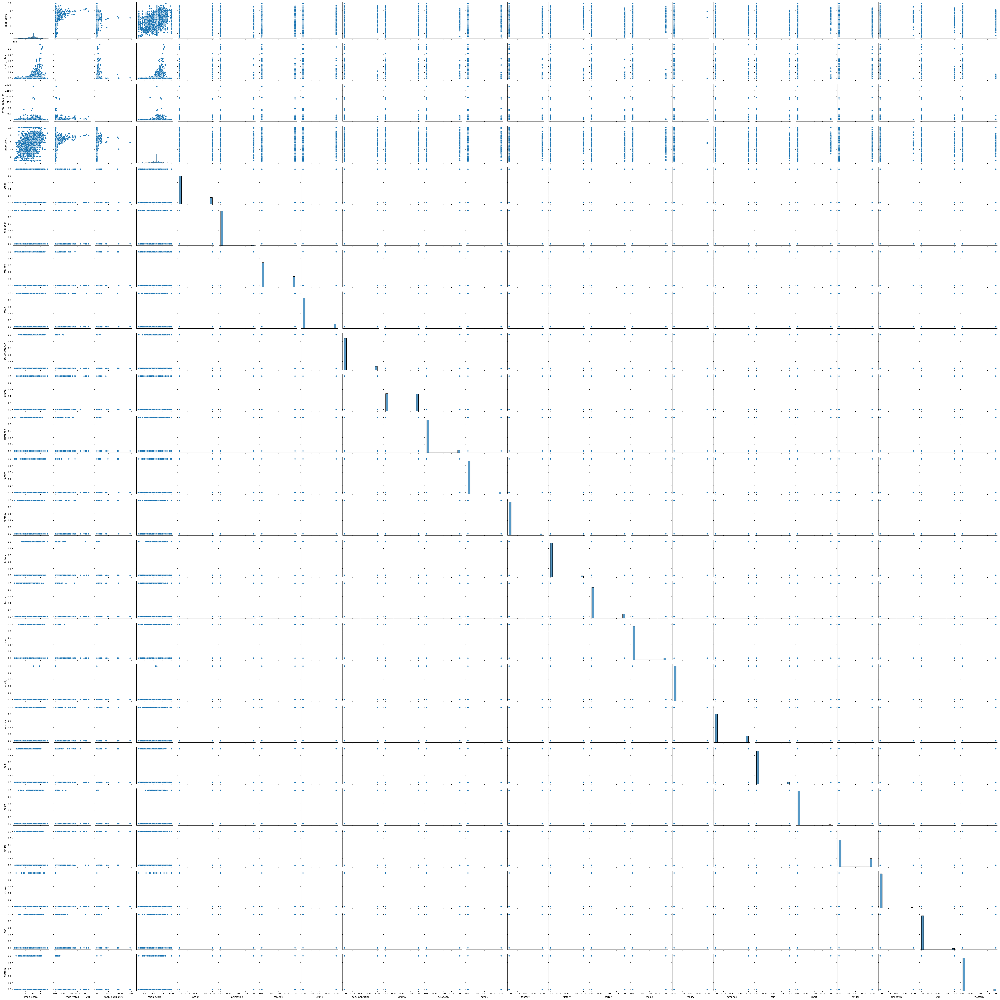

In [93]:
# Pair Plot visualization code

sns.pairplot(mv_genres_ratings)
plt.show()

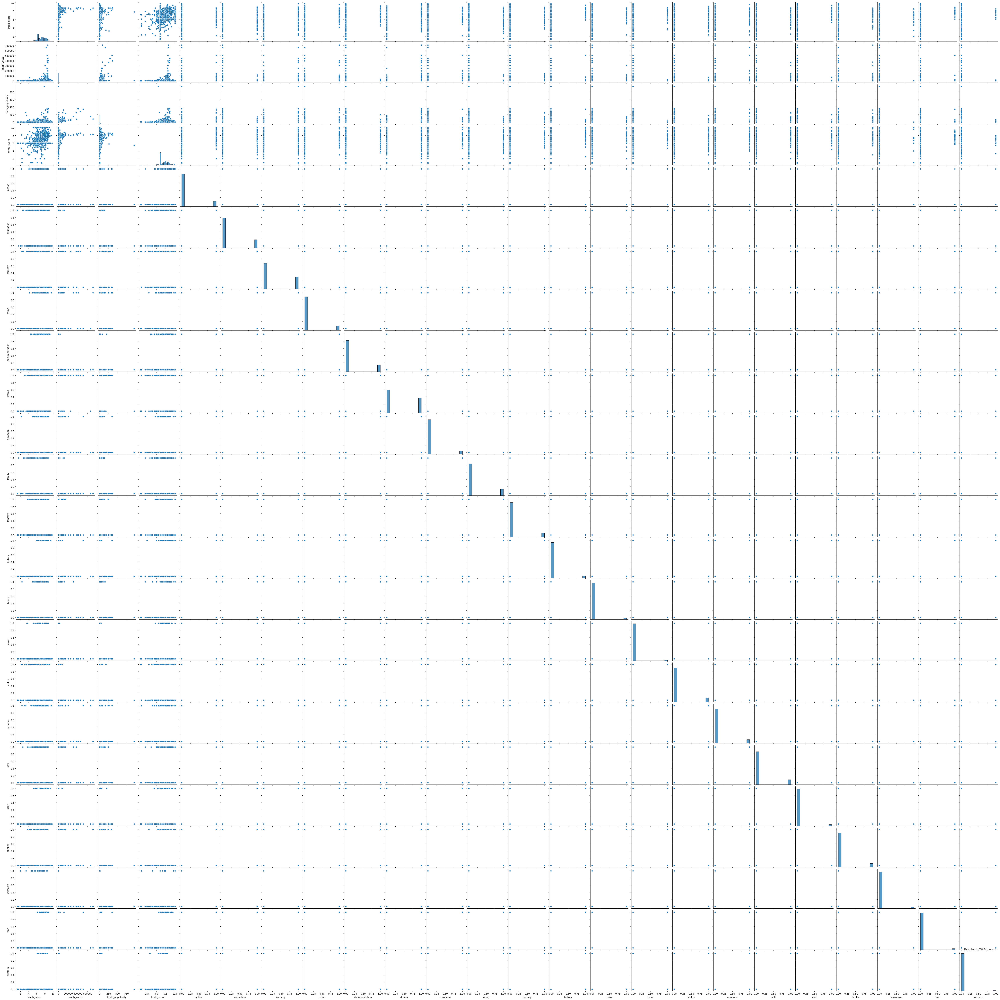

In [94]:
sns.pairplot(tv_genres_ratings)
plt.title("Pairplot in TV Shows")
plt.show()

##### 1. Why did you pick the specific chart?

This chart is a pair plot (scatterplot matrix), which is commonly used to explore relationships between multiple numerical variables in a dataset. The chart was chosen because it:
* Shows correlations between different metrics.\
* Visualizes distributions of individual variables.\
* Helps detect patterns, trends, or outliers that might not be obvious in raw data.



##### 2. What is/are the insight(s) found from the chart?

The diagonal line represents each variable's distribution, while scatterplots show pairwise relationships.
Strongly linear patterns suggest high correlation, while scattered points indicate weak relationships

## **5. Solution to Business Objective**

#### What do you suggest the client to achieve Business Objective ?
Explain Briefly.

Based on the exploratory data analysis on Amazon Prime Video Dataset, the following recommendations are proposed to achieve business objective of Business objective for maximizing user satisfaction and subscription growth.

**1. Content Diversification Strategy :** Expand Genre Variety, Acquire Grene Blending projects to engage users.

**2. Quality Content Enhancement :** Acquire and promoting content with high IMDB and TMDB scores, especially those with High vote counts and also promote high rated and less popular content and boost visibility.

**3. Enhanced Recommendation Engine :** Improve recommendation engine by including genre preferences, regional popularity and user rating.

# **Conclusion**

This EDA project provides insightful information on the content ecosystem of Amazon Prime Video. Knowing viewer appeal, regional differences, and temporal trends allows Amazon Prime to make informed decisions to enhance content buying, schedule optimization, and user satisfaction. The findings include the overwhelming preference for movies compared to TV series, the demand for certain genres such as drama and comedy, and the demand for international and diverse programming. By adopting the suggestions presented, Amazon Prime can solidify its position in the competitive streaming space, optimize subscription growth, and meet the changing demands of its international audience. Additional analysis that includes credits data and more granular user demographics may yield even greater insights for targeted content strategies and recommendations.

### ***Hurrah! You have successfully completed your EDA Capstone Project !!!***